# Lending Club Case study

## Problem Statement:
The given dataset contains the information about the past loan application and whether they have defaulted or not. the objective of this case study is to idenfy the pattern which indicate if a person is likely to default which may be used for taking the decision whether to deny the loan. reduce the loan amount, lending at higher interest rates etc. 

Results Expected
Write all your code in one well-commented Python file; briefly mention the insights and observations from the analysis 
Present the overall approach of the analysis in a presentation:   
Mention the problem statement and the analysis approach briefly   
Explain the results of univariate, bivariate analysis etc. in business terms   
Include visualisations and summarise the most important results in the presentation



### Import the python libraries

In [86]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
pd.set_option('max_columns',None)
pd.set_option('max_rows',None)

### Read input dataset

In [87]:
df = pd.read_csv('loan.csv')

In [88]:
df.shape

(39717, 111)

### Observation: 
    The dataset have 39717 records having 111 columns/feature variable

In [89]:
df.head(3)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,0.0,0.0,5863.155187,5833.84,5000.00,863.16,0.0,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.0,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,f,0.0,0.0,3005.666844,3005.67,2400.00,605.67,0.0,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


###  Analyze the null values in the dataset.

In [90]:
(df.isnull().mean()*100).round(2)

id                                  0.00
member_id                           0.00
loan_amnt                           0.00
funded_amnt                         0.00
funded_amnt_inv                     0.00
term                                0.00
int_rate                            0.00
installment                         0.00
grade                               0.00
sub_grade                           0.00
emp_title                           6.19
emp_length                          2.71
home_ownership                      0.00
annual_inc                          0.00
verification_status                 0.00
issue_d                             0.00
loan_status                         0.00
pymnt_plan                          0.00
url                                 0.00
desc                               32.58
purpose                             0.00
title                               0.03
zip_code                            0.00
addr_state                          0.00
dti             

In [91]:
print(' {} columns having 0% fill rate.'.format(len(df.columns[df.isnull().mean()*100 == 100])))

 54 columns having 0% fill rate.


### Observation: 
There are 54 columns having 0% fill rate. i.e. all rows for these columns are missing.

### Drop the columns having null values in all rows. 

In [92]:
df.dropna(axis=1, how='all',inplace=True)

In [93]:
len(df.columns[df.isnull().mean()*100 == 100])

0

### Observation :
1. Below columns have still more than 60 percent of missing values so we can drop them safely.     
mths_since_last_delinq          
mths_since_last_record         
next_pymnt_d

In [94]:
cols = ['mths_since_last_delinq','mths_since_last_record','next_pymnt_d']

In [95]:
df.drop(cols,axis=1,inplace=True)

In [96]:
df.isnull().sum()

id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
term                              0
int_rate                          0
installment                       0
grade                             0
sub_grade                         0
emp_title                      2459
emp_length                     1075
home_ownership                    0
annual_inc                        0
verification_status               0
issue_d                           0
loan_status                       0
pymnt_plan                        0
url                               0
desc                          12940
purpose                           0
title                            11
zip_code                          0
addr_state                        0
dti                               0
delinq_2yrs                       0
earliest_cr_line                  0
inq_last_6mths              

### Observation:
The below columns seems customer behavioural data, which doesn't have any impact on loan approval decision making. so we can exclude them from our analysis. 

In [97]:
### Drop customer behavioural data from the analysis.  
cols_to_drop = ['url',
 'delinq_2yrs',
 'earliest_cr_line',
 'inq_last_6mths',
 'open_acc',
 'pub_rec',
 'revol_bal',
 'revol_util',
 'total_acc',
 'out_prncp',
 'out_prncp_inv',
 'total_pymnt',
 'total_pymnt_inv',
 'total_rec_prncp',
 'total_rec_int',
 'total_rec_late_fee',
 'recoveries',
 'collection_recovery_fee',
 'last_pymnt_d',
 'last_pymnt_amnt',  
 'last_credit_pull_d',
 'collections_12_mths_ex_med',  
 'acc_now_delinq',
 'desc'
 ]

In [98]:
df.drop(cols_to_drop,axis=1,inplace=True)

In [99]:
df.isnull().mean().round(2)

id                          0.00
member_id                   0.00
loan_amnt                   0.00
funded_amnt                 0.00
funded_amnt_inv             0.00
term                        0.00
int_rate                    0.00
installment                 0.00
grade                       0.00
sub_grade                   0.00
emp_title                   0.06
emp_length                  0.03
home_ownership              0.00
annual_inc                  0.00
verification_status         0.00
issue_d                     0.00
loan_status                 0.00
pymnt_plan                  0.00
purpose                     0.00
title                       0.00
zip_code                    0.00
addr_state                  0.00
dti                         0.00
initial_list_status         0.00
policy_code                 0.00
application_type            0.00
chargeoff_within_12_mths    0.00
delinq_amnt                 0.00
pub_rec_bankruptcies        0.02
tax_liens                   0.00
dtype: flo

#### Note: We have removed all non-relevant null value columns as a part of data clean-up activity

In [100]:
### size of dataframe after removing the null value columns
df.shape

(39717, 30)

In [101]:
df.head(3)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,purpose,title,zip_code,addr_state,dti,initial_list_status,policy_code,application_type,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,credit_card,Computer,860xx,AZ,27.65,f,1,INDIVIDUAL,0.0,0,0.0,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,car,bike,309xx,GA,1.00,f,1,INDIVIDUAL,0.0,0,0.0,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,small_business,real estate business,606xx,IL,8.72,f,1,INDIVIDUAL,0.0,0,0.0,0.0


### Data Description:
1. id, member-id : These are customer's id
2. loan_amnt  : This is loan amount borrower has request for. 
3. funded_amnt: This is loan amount the agency has approved. 
4. funded_amnt_inv : this is the loan amount the invester/lender has approved and given to borrower. 
5. term: this is the total tenure of installment. 
6. int_rate : Interest rate on loan. 
7. installment: this is installment amount. 
8. grade : This is grade assigned by agency( lending club).
9. subgrade : This is subgrade assigned by agency( Lending club).
10. emp_title : Emp_title of the borrower. 
11. emp_length : since when the borrower is employed. 
12. home_ownership : whether the borrower is owner or tenent?
13. annual_inc: Annual income of borrower.
14. Verification_status : whether the source of income is verified or not 
15. Loan_status : this is our tager variable, which we will be analyzing for whether the loan got fully paid or defaulted. 
16. purpose : what is the purpose of loan request. 
17. title  : title of borrower
18. zip_code and addr_state : geo location of borrowers
19. A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.
 

## Univariate analysis. 

In [102]:
## Describe the dataset
df.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,policy_code,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.0,39661.0,39717.0,39020.000000,39678.0
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,324.561922,6.896893e+04,13.315130,1.0,0.0,0.0,0.043260,0.0
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,208.874874,6.379377e+04,6.678594,0.0,0.0,0.0,0.204324,0.0
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,1.0,0.0,0.0,0.000000,0.0
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,167.020000,4.040400e+04,8.170000,1.0,0.0,0.0,0.000000,0.0
50%,6.656650e+05,8.508120e+05,10000.000000,9600.000000,8975.000000,280.220000,5.900000e+04,13.400000,1.0,0.0,0.0,0.000000,0.0
75%,8.377550e+05,1.047339e+06,15000.000000,15000.000000,14400.000000,430.780000,8.230000e+04,18.600000,1.0,0.0,0.0,0.000000,0.0
max,1.077501e+06,1.314167e+06,35000.000000,35000.000000,35000.000000,1305.190000,6.000000e+06,29.990000,1.0,0.0,0.0,2.000000,0.0


### Observation : 
We can see couple of columns (e.g. pymnt_plan, initial_list_status..) having same min, max, that means these columns are having constant value, and would not have any impact on payment status, so we can safely remove them from our dataset. 

In [103]:
cols = list(df.columns[df.nunique() == 1])     ## check the columns having unique values
cols

['pymnt_plan',
 'initial_list_status',
 'policy_code',
 'application_type',
 'chargeoff_within_12_mths',
 'delinq_amnt',
 'tax_liens']

In [104]:
df.drop(cols,axis=1,inplace=True)

In [105]:
df.shape

(39717, 23)

### 1. Univariate analysis on Loan_Status

In [106]:
df['loan_status'].value_counts()

Fully Paid     32950
Charged Off     5627
Current         1140
Name: loan_status, dtype: int64

### Observation :
There are 3 kind of loan status, one is fully paid, the second one is charged off means defaults, which the 3rd one is Current. as per business requirement, we need to drop all records having loan status = 'current', as we can't make any business rule using such details. 

In [107]:
df = df[~(df.loan_status == 'Current')]

In [108]:
df.loan_status.value_counts().to_frame()

,loan_status
Fully Paid,32950
Charged Off,5627


In [109]:
import plotly.express as px
fig = px.pie(df.loan_status.value_counts().to_frame(),values='loan_status',names=df.loan_status.value_counts().to_frame().index)
fig.update_layout(
    title={
        'text': "Loan status summary",
        'y':0.95,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'},legend_title="loan_status")
fig.show()

### Observation : 
There are around 85% of borrowers are paying back the loan fully, while 14.6 are getting defaulted.

### 2. Univariate analysis on Loan_amnt

In [110]:
import plotly.express as px
fig = px.histogram(df, x=["loan_amnt"])
fig.update_layout(
    title={
        'text': "Loan Amount - Distribution",
        'y':0.95,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()

### Observation :
After visualizing above histogram we can infer that most of the distribution falls around 5k-10. 

In [111]:
fig = px.box(df,y='loan_amnt')
fig.update_layout(
    title={
        'text': "Loan Amount spread",
        'y':0.95,
        'x':0.50,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()

In [112]:
q1 = df.loan_amnt.quantile(q=.25,interpolation='linear')
q2 = df.loan_amnt.quantile(q=.50,interpolation='linear')
q3 = df.loan_amnt.quantile(q=.75,interpolation='linear')
iqr = q3-q1
lower_range = q1 - 1.5 * iqr
upper_range = q3 + 1.5 * iqr 
print('Q1 is :{}, Q2 is :{}, Q3 is :{} and IQR is :{}'.format(q1,q2,q3,iqr))
print('lower whisker is :{}, and the upper whisker is :{}'.format(lower_range,upper_range))

Q1 is :5300.0, Q2 is :9600.0, Q3 is :15000.0 and IQR is :9700.0
lower whisker is :-9250.0, and the upper whisker is :29550.0


In [113]:
print('number of outlier in lower range is :', df[df.loan_amnt < 0].shape)
print('number of outlier in upper range is :', df[df.loan_amnt > upper_range].shape)

number of outlier in lower range is : (0, 23)
number of outlier in upper range is : (1088, 23)


### Observation:
1. After analyzing distribution plot and box plot we can say that the loan amount is not normally distributed. majority of the population falls between 5k - 15k.
2. The first quantile(q1): 5.3k, second quantile(q2) or median is: 9.6K and the third quantile is : 15k
3. the lower whisker is -8750 and the upper whisker is 29550.00
4. There are 1088 loan application for which the loan amount is greater than upper whisker. though they are greater than upper whisker, but we should avoid saying them outliers, they might be legitimate applications.  


### 3. Univariate analysis on Loan Term

In [114]:
df.term.value_counts().to_frame()

,term
36 months,29096
60 months,9481


In [115]:
import plotly.express as px
fig = px.pie(df.term.value_counts().to_frame(),values='term',names=df.term.value_counts().to_frame().index)
fig.update_layout(
    title={
        'text': "Loan term summary",
        'y':0.95,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'},legend_title="term")

fig.show()

### Observation :
Manority (around 75%) people are choosing lower term(36 months) for replayment while 25% are choosing higher term( 60 months ) for replayment.  

### 4. Univariate analysis on Grade

In [116]:
df.grade.value_counts().to_frame()

,grade
B,11675
A,10045
C,7834
D,5085
E,2663
F,976
G,299


In [117]:
import plotly.express as px
fig = px.pie(df.grade.value_counts().to_frame(),values='grade',names=df.grade.value_counts().to_frame().index)
fig.update_layout(
    title={
        'text': "grade summary",
        'y':0.95,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'},legend_title="grade")

fig.show()

### Observation:
There are around 30.3% of borrowers comes under grade B, 26% under A, very few (.77%) borrowers comes 
under grade G.

### 5. Univariate analysis on Sub-Grade

In [118]:
df.sub_grade.value_counts().to_frame()

,sub_grade
A4,2873
B3,2825
A5,2715
B5,2615
B4,2437
C1,2055
B2,2001
C2,1931
A3,1810
B1,1797


In [119]:
import plotly.express as px
fig = px.pie(df.sub_grade.value_counts().to_frame(),values='sub_grade',names=df.sub_grade.value_counts().to_frame().index)
fig.update_layout(
    title={
        'text': "sub grade summary",
        'y':0.95,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'},legend_title="sub_grade")

fig.show()

### 6. Univariate analysis on Home Ownership

In [120]:
df.home_ownership.value_counts().to_frame()

,home_ownership
RENT,18480
MORTGAGE,17021
OWN,2975
OTHER,98
NONE,3


In [121]:
import plotly.express as px
fig = px.pie(df.home_ownership.value_counts().to_frame(),values='home_ownership',names=df.home_ownership.value_counts().to_frame().index)
fig.update_layout(
    title={
        'text': "Home ownership details",
        'y':0.95,
        'x':0.50,
        'xanchor': 'center',
        'yanchor': 'top'},legend_title="home_ownership")

fig.show()

### Observation : 
Most Borrowers are either living in rented accomodation or mortgage accomodation  

### 7 : Univariate analysis on Annual_income 

In [122]:
df['annual_inc'].describe().round(2)

count      38577.00
mean       68777.97
std        64218.68
min         4000.00
25%        40000.00
50%        58868.00
75%        82000.00
max      6000000.00
Name: annual_inc, dtype: float64

In [123]:
import plotly.express as px
fig = px.box(df,y='annual_inc')
fig.update_layout(
    title={
        'text': "Income distribution",
        'y':0.95,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()

### Observation
The above box plot clearly shows that there are some outliers having income around 2 millions to 6 millions.

### Recommandations:
These outliers needs to be treated while preparing the data for model building, as it might influence the model's performence. 

### 9. Univariate analysis on Income Verification status

In [124]:
df.verification_status.value_counts().to_frame()

,verification_status
Not Verified,16694
Verified,12206
Source Verified,9677


In [125]:
import plotly.express as px
fig = px.pie(df.verification_status.value_counts().to_frame(),values='verification_status',names=df.verification_status.value_counts().to_frame().index)
fig.update_layout(
    title={
        'text': "income verification summary",
        'y':0.95,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'},legend_title="verification_status")

fig.show()

### Observation :
For around 43% cases the income source is not verified.  

In [126]:
df.head(1)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,zip_code,addr_state,dti,pub_rec_bankruptcies
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,credit_card,Computer,860xx,AZ,27.65,0.0


### 10. Univariate analysis on Purpose

In [127]:
df.purpose.value_counts().to_frame()

,purpose
debt_consolidation,18055
credit_card,5027
other,3865
home_improvement,2875
major_purchase,2150
small_business,1754
car,1499
wedding,926
medical,681
moving,576


In [128]:
import plotly.express as px
fig = px.pie(df.purpose.value_counts().to_frame(),values='purpose',names=df.purpose.value_counts().to_frame().index)
fig.update_layout(
    title={
        'text': "purpose of loan",
        'y':0.95,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'},legend_title="purpose")

fig.show()

## Observation: 
Around 46.8% loan applications have purpose to consolidate their previous ongoing loans.

### 11.  Univariate analysis on dti

In [129]:
df.dti.describe()

count    38577.000000
mean        13.272727
std          6.673044
min          0.000000
25%          8.130000
50%         13.370000
75%         18.560000
max         29.990000
Name: dti, dtype: float64

In [130]:
fig = px.box(df, y= 'dti')
fig.show()

### 12. Univariate analysis on pub_rec_bankruptcies

In [131]:
df.pub_rec_bankruptcies.value_counts().to_frame()

,pub_rec_bankruptcies
0.0,36238
1.0,1637
2.0,5


In [132]:
fig = px.pie(df.pub_rec_bankruptcies.value_counts().to_frame(),values='pub_rec_bankruptcies',names=df.pub_rec_bankruptcies.value_counts().to_frame().index)
fig.update_layout(
    title={
        'text': "available bankrupties",
        'y':0.95,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'},legend_title="pub_rec_bankruptcies")
fig.show()

### Observation :
for around 95.7% cases there is no pulic bankrupties records, means they never declared as bankrup in past. around 4.32% cases have shown 1 bankrupt record in public while .013% have 2 bankrupt records in public. 


## Bivariate analysis

In [133]:
### Check the correlation between features. 
df.corr()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,pub_rec_bankruptcies
id,1.000000,0.993534,0.120614,0.131283,0.231603,0.076088,0.005572,0.091785,-0.007997
member_id,0.993534,1.000000,0.120393,0.130307,0.241324,0.070918,0.006442,0.092910,-0.007346
loan_amnt,0.120614,0.120393,1.000000,0.981790,0.937922,0.932260,0.268999,0.062436,-0.035981
funded_amnt,0.131283,0.130307,0.981790,1.000000,0.956172,0.958035,0.264798,0.062194,-0.036995
funded_amnt_inv,0.231603,0.241324,0.937922,0.956172,1.000000,0.905464,0.251981,0.070663,-0.041193
installment,0.076088,0.070918,0.932260,0.958035,0.905464,1.000000,0.267842,0.052038,-0.033361
annual_inc,0.005572,0.006442,0.268999,0.264798,0.251981,0.267842,1.000000,-0.121530,-0.016224
dti,0.091785,0.092910,0.062436,0.062194,0.070663,0.052038,-0.121530,1.000000,0.005966
pub_rec_bankruptcies,-0.007997,-0.007346,-0.035981,-0.036995,-0.041193,-0.033361,-0.016224,0.005966,1.000000


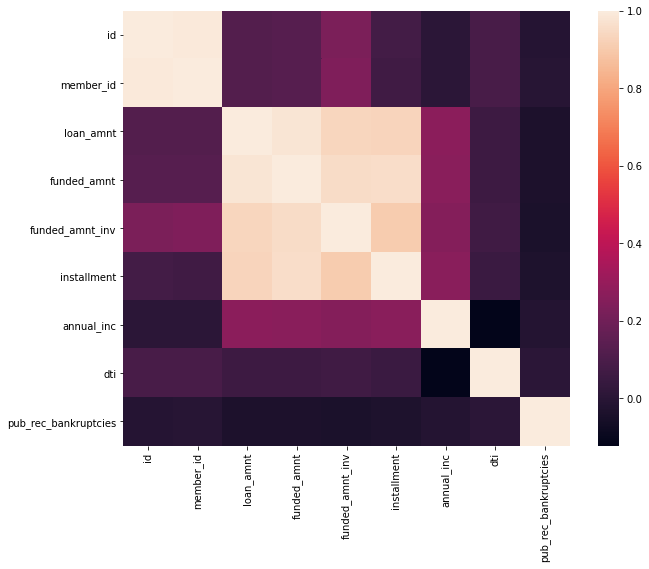

In [134]:
plt.figure(figsize=(10,8))
sns.heatmap(df.corr())
plt.show()

### Observation:
1) After seeing above correlation results we can infer that loan_amount, funded_amount, funded amount invoice and installement are highly correlated, so we can pick just one feature for analyzing the relationship with target variable.    
2) total_payment, total_palyment_inv and total_rec_pmcp are also highly correlated. 

## 1. Loan_Amount vs Loan_status

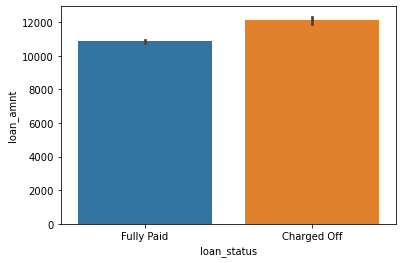

In [135]:
sns.barplot(data=df,x='loan_status', y='loan_amnt')
plt.show()

# import plotly.express as px
# fig = px.bar(df,x="loan_status", y="loan_amnt")
# fig.show()



In [136]:
df.groupby(by='loan_status')['loan_amnt'].mean()

loan_status
Charged Off    12104.385108
Fully Paid     10866.455994
Name: loan_amnt, dtype: float64

In [137]:
# sns.boxplot(data=df,x='loan_status',y='loan_amnt')
# plt.show()
import plotly.express as px
fig = px.box(df,x='loan_status',y='loan_amnt',color="loan_status")
fig.show()

### Observation:
1. It is obvious from above box plot and bar plot, that the people who have taken lower loan amount have shown higher changes to pay it back fully than the people who have taken higher loan amount. 


## 2. Term vs Loan_status

In [138]:
df1 = pd.pivot_table(df,values='id',index=['term','loan_status'],aggfunc='count').reset_index().rename(columns={'id':'count'})         
df1

,term,loan_status,count
0,36 months,Charged Off,3227
1,36 months,Fully Paid,25869
2,60 months,Charged Off,2400
3,60 months,Fully Paid,7081


In [139]:
df2 = df1.groupby(by='term')['count'].sum().to_frame().reset_index().rename(columns={'count':'grp_term_count'})
df2

,term,grp_term_count
0,36 months,29096
1,60 months,9481


In [140]:
df3 = pd.merge(df1,df2,on='term',how='left')
df3

,term,loan_status,count,grp_term_count
0,36 months,Charged Off,3227,29096
1,36 months,Fully Paid,25869,29096
2,60 months,Charged Off,2400,9481
3,60 months,Fully Paid,7081,9481


In [141]:
df3['loan_status%'] =  (df3['count']/df3['grp_term_count']*100).round(2)
df3

,term,loan_status,count,grp_term_count,loan_status%
0,36 months,Charged Off,3227,29096,11.09
1,36 months,Fully Paid,25869,29096,88.91
2,60 months,Charged Off,2400,9481,25.31
3,60 months,Fully Paid,7081,9481,74.69


In [142]:
import plotly.express as px

fig = px.bar(df3, x='term', y='loan_status%',hover_data=['count'],
              color='loan_status',
             labels={'loan_status%':'Payment Status in %'}, height=400)
fig.show()


### Observation :
The chances of getting default is 2+ times more for term 60 months as compare to 36 months. 

## 3. Interest rate vs Loan Status

In [143]:
df.head(2)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,zip_code,addr_state,dti,pub_rec_bankruptcies
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,credit_card,Computer,860xx,AZ,27.65,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,car,bike,309xx,GA,1.00,0.0


In [144]:
df4 = df[['int_rate','loan_status']]

In [145]:
df4['int_rate'] = df4['int_rate'].str.replace('%','')

In [146]:
df4['int_rate'] = df4['int_rate'].astype(float)

In [147]:
df4.head(4)

,int_rate,loan_status
0,10.65,Fully Paid
1,15.27,Charged Off
2,15.96,Fully Paid
3,13.49,Fully Paid


In [148]:
fig = px.box(df4,x='loan_status',y='int_rate',color="loan_status")
fig.show()


### Observation:
From the above box plot it looks the chances of going defaulter is high when the loan is given on higher interest rates. 

### Recommandation:
It seems that LC and Lenders already have low confidence on high risk loan application but in greed of higher return they offer loan on high interest rates resulting loan became default. 

## 4. Installment vs Loan_Status

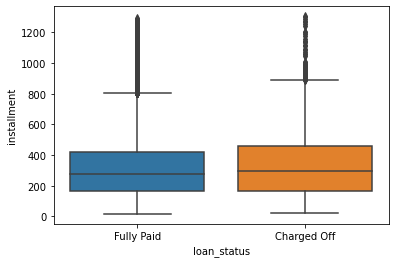

In [149]:
sns.boxplot(data=df,x='loan_status',y='installment')
plt.show()

### Observation:
    No inferrence is coming out for installment vs loan status.  

## 5. Grade vs Loan_status

In [150]:
df5 = pd.pivot_table(df,index=['grade','loan_status'],values='id',aggfunc='count').rename(columns={'id':'count'}).reset_index()
df5

,grade,loan_status,count
0,A,Charged Off,602
1,A,Fully Paid,9443
2,B,Charged Off,1425
3,B,Fully Paid,10250
4,C,Charged Off,1347
5,C,Fully Paid,6487
6,D,Charged Off,1118
7,D,Fully Paid,3967
8,E,Charged Off,715
9,E,Fully Paid,1948


In [151]:
df6 = df5.groupby('grade').sum().reset_index().rename(columns={'count':'grade_agg_count'})
df6

,grade,grade_agg_count
0,A,10045
1,B,11675
2,C,7834
3,D,5085
4,E,2663
5,F,976
6,G,299


In [152]:
df7 = pd.merge(df5,df6,on='grade',how='left')
df7['loan_status%'] = (df7['count']/df7['grade_agg_count']*100).round(2)
df7

,grade,loan_status,count,grade_agg_count,loan_status%
0,A,Charged Off,602,10045,5.99
1,A,Fully Paid,9443,10045,94.01
2,B,Charged Off,1425,11675,12.21
3,B,Fully Paid,10250,11675,87.79
4,C,Charged Off,1347,7834,17.19
5,C,Fully Paid,6487,7834,82.81
6,D,Charged Off,1118,5085,21.99
7,D,Fully Paid,3967,5085,78.01
8,E,Charged Off,715,2663,26.85
9,E,Fully Paid,1948,2663,73.15


In [153]:
import plotly.express as px

fig = px.bar(df7, x='grade', y='loan_status%',hover_data=['count'],
              color='loan_status',
             labels={'loan_status%':'Payment Status in %'}, height=400)
fig.show()

### Observation:
1. It is clear from the above bar plot that percentage of charged off ( defaulters ) is 33% for the borrowers who have graded as "G".
2. The percentage of charged off( defaulters) is very less ( 5.99% ) for the borrowers graded as "A".

### Recommandation : 
Lending money to A,B and C grade applicants is safer than grade D,E,F, and G

## 6. Sub Grade vs Loan_status

In [154]:
df8 = pd.pivot_table(df,index=['sub_grade','loan_status'],values='id',aggfunc='count').rename(columns={'id':'count'}).reset_index()
df8

,sub_grade,loan_status,count
0,A1,Charged Off,30
1,A1,Fully Paid,1109
2,A2,Charged Off,74
3,A2,Fully Paid,1434
4,A3,Charged Off,103
5,A3,Fully Paid,1707
6,A4,Charged Off,178
7,A4,Fully Paid,2695
8,A5,Charged Off,217
9,A5,Fully Paid,2498


In [155]:
df9 = df8.groupby('sub_grade').sum().reset_index().rename(columns={'count':'subgrade_agg_count'})
df9

,sub_grade,subgrade_agg_count
0,A1,1139
1,A2,1508
2,A3,1810
3,A4,2873
4,A5,2715
5,B1,1797
6,B2,2001
7,B3,2825
8,B4,2437
9,B5,2615


In [156]:
df10 = pd.merge(df8,df9,on='sub_grade',how='left')
df10['loan_status%'] = (df10['count']/df10['subgrade_agg_count']*100).round(2)
df10

,sub_grade,loan_status,count,subgrade_agg_count,loan_status%
0,A1,Charged Off,30,1139,2.63
1,A1,Fully Paid,1109,1139,97.37
2,A2,Charged Off,74,1508,4.91
3,A2,Fully Paid,1434,1508,95.09
4,A3,Charged Off,103,1810,5.69
5,A3,Fully Paid,1707,1810,94.31
6,A4,Charged Off,178,2873,6.20
7,A4,Fully Paid,2695,2873,93.80
8,A5,Charged Off,217,2715,7.99
9,A5,Fully Paid,2498,2715,92.01


In [157]:
import plotly.express as px

fig = px.bar(df10, x='sub_grade', y='loan_status%',hover_data=['count'],
              color='loan_status',
             labels={'loan_status%':'Payment Status in %'}, height=400)
fig.show()

### observation :
The above bar plot shows that the sub_group = F4,F5,G3 and G5 have very high chances to go for default. the same trend we concluded from group as well. 

## 7. Income vs Loan_Status

In [158]:
import plotly.express as px
fig = px.box(df, x='loan_status', y='annual_inc')
fig.show()

## Observation: 
The median annual income for fully paid category is 60k and for charged off category is 53k, that means low income group have 
slightly more tendency of getting defaulters. 

## 8. Verification_status vs loan_status

In [159]:
df11 = pd.pivot_table(df,values='id',index=['verification_status','loan_status'],aggfunc='count').reset_index().rename(columns={'id':'count'})

In [160]:
df11['verification_status'] = df11['verification_status'].replace('Source Verified','Verified')

In [161]:
df12 = df11.groupby(by=['verification_status','loan_status'])['count'].sum().to_frame().reset_index()
df12

,verification_status,loan_status,count
0,Not Verified,Charged Off,2142
1,Not Verified,Fully Paid,14552
2,Verified,Charged Off,3485
3,Verified,Fully Paid,18398


In [162]:
df13 = df12.groupby('verification_status').sum().reset_index().rename(columns={'count':'agg_ver_status'})
df13

,verification_status,agg_ver_status
0,Not Verified,16694
1,Verified,21883


In [163]:
df14 = pd.merge(df12,df13,on='verification_status',how='outer')
df14['loan_status%'] = (df14['count']/df14['agg_ver_status']*100).round(2)
df14

,verification_status,loan_status,count,agg_ver_status,loan_status%
0,Not Verified,Charged Off,2142,16694,12.83
1,Not Verified,Fully Paid,14552,16694,87.17
2,Verified,Charged Off,3485,21883,15.93
3,Verified,Fully Paid,18398,21883,84.07


In [164]:
import plotly.express as px

fig = px.bar(df14, x='verification_status', y='loan_status%',hover_data=['count'],
              color='loan_status',
             labels={'loan_status%':'Payment Status in %'}, height=400)
fig.show()

## 9. Purpose vs loan_status

In [165]:
df15 = df.groupby(by=['purpose','loan_status'])['id'].count().to_frame().rename(columns={'id':'count'}).reset_index()
df16 = df15.groupby('purpose').sum().reset_index().rename(columns={'count':'agg_purpose_count'})
df17 = pd.merge(df15,df16,on='purpose',how='outer')
df17['loan_status%'] = (df17['count']/df17['agg_purpose_count']*100).round(2)
df17

,purpose,loan_status,count,agg_purpose_count,loan_status%
0,car,Charged Off,160,1499,10.67
1,car,Fully Paid,1339,1499,89.33
2,credit_card,Charged Off,542,5027,10.78
3,credit_card,Fully Paid,4485,5027,89.22
4,debt_consolidation,Charged Off,2767,18055,15.33
5,debt_consolidation,Fully Paid,15288,18055,84.67
6,educational,Charged Off,56,325,17.23
7,educational,Fully Paid,269,325,82.77
8,home_improvement,Charged Off,347,2875,12.07
9,home_improvement,Fully Paid,2528,2875,87.93


In [166]:
import plotly.express as px

fig = px.bar(df17, x='purpose', y='loan_status%',hover_data=['count'],
              color='loan_status',
             labels={'loan_status%':'Payment Status in %'}, height=400)
fig.show()

## Observation :
1. The chances of getting defaulter is very high for the purpose type small_business.
2. Other purpose categories are house, education, debt_consolidation other and renewable_energy where chances of getting defaulter is high

In [167]:
df.head(3)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,zip_code,addr_state,dti,pub_rec_bankruptcies
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,credit_card,Computer,860xx,AZ,27.65,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,car,bike,309xx,GA,1.00,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,small_business,real estate business,606xx,IL,8.72,0.0


## 10. dti vs loan_status

In [168]:
fig = px.box(df,x='loan_status',y='dti')
fig.show()

## Observation : 
No significant insights are coming out from above stats. 

## 11. pub_rec_bankruptcies vs loan_status

In [169]:
df18 = df.groupby(by=['pub_rec_bankruptcies','loan_status'])['id'].count().to_frame().reset_index().rename(columns={'id':'count'})
df18
df19 = df18.groupby('pub_rec_bankruptcies').sum().reset_index().rename(columns={'count':'agg_count'})
df19
df20 = pd.merge(df18,df19,on='pub_rec_bankruptcies',how='outer')

df20['loan_status%'] = (df20['count']/df20['agg_count']*100).round(2)
df20

,pub_rec_bankruptcies,loan_status,count,agg_count,loan_status%
0,0.0,Charged Off,5141,36238,14.19
1,0.0,Fully Paid,31097,36238,85.81
2,1.0,Charged Off,366,1637,22.36
3,1.0,Fully Paid,1271,1637,77.64
4,2.0,Charged Off,2,5,40.00
5,2.0,Fully Paid,3,5,60.00


In [170]:
import plotly.express as px

fig = px.bar(df20, x='pub_rec_bankruptcies', y='loan_status%',hover_data=['count'],
              color='loan_status',
             labels={'loan_status%':'Payment Status in %'}, height=400)
fig.show()

## Observation :
Looks like the chances of going defaulters is high if the borrowers have atleast one public record of bankrupties. 

### Recommandation 
Lending money to borrower having atleast 1 public record of bankrupties is risky. 